In [1]:
import SimpleITK as sitk
import numpy as np
import pandas as pd
import glob, os
import matplotlib.pyplot as plt
import ipywidgets as widgets

%matplotlib inline

[About Simple ITK images' dimensions](https://simpleitk.org/doxygen/latest/html/classitk_1_1simple_1_1DICOMOrientImageFilter.html)


In [11]:
labels_path = "/Users/dutking/LOCAL/AI_uni/radlogix/dataset/labels"  # /LUNG1-001/LUNG1-001_effusion_first_reviewer.nii.gz
lungs_path = "/Users/dutking/LOCAL/AI_uni/radlogix/dataset/lungs_labels"  # /LUNG1-001/LUNG1-001_thor_cav_primary_reviewer.nii.gz
features_path = "/Users/dutking/LOCAL/AI_uni/radlogix/dataset/features"  # /LUNG1-001/09-18-2008-StudyID-NA-69331/0.000000-NA-82046
WINDOW_MIN = -500
WINDOW_MAX = 500


In [3]:
df = pd.read_csv("./_docs/clean_df_on_latest_ds.csv", index_col="PatientID")
df.head(3)
# effusion_df = df.drop(df[df['Effusion.Event'] == 0].index)
# no_effusion_df = df.drop(df[df['Effusion.Event'] == 1].index).iloc[:len(effusion_df), :]


,Carcinoma.Laterality,GTV1,GTV2,GTV3,GTV4,GTV5,GTV6,Tumor.Location,Effusion.Event,Primary.Effusion.Reviewer,...,Dim.z,Voxel.Space.x,Voxel.Space.y,Voxel.space.z,Feature.Slices,Valid.Feature,Valid.Label,Label.Slices,Label.Gaps,Label.Outliers
PatientID,,,,,,,,,,,,,,,,,,,,,
LUNG1-002,R,340.3,NaN,NaN,NaN,NaN,NaN,3.0,1.0,Rad4,...,111.0,0.977000,0.977000,3.0,111.0,1.0,1.0,111.0,NaN,NaN
LUNG1-004,L,86.5,7.06,70.38,NaN,NaN,NaN,3.0,0.0,NaN,...,114.0,0.976563,0.976563,3.0,114.0,1.0,NaN,NaN,NaN,NaN
LUNG1-006,L,75.9,NaN,NaN,NaN,NaN,NaN,1.0,0.0,NaN,...,114.0,0.977000,0.977000,3.0,114.0,1.0,NaN,NaN,NaN,NaN


In [4]:
def get_dicom_folder(id):
    for root, _, files in os.walk(f"{features_path}/{id}", topdown=False):
        if files[0].endswith(".dcm"):
            return root


def read_feature_image(id):
    dicom_folder = get_dicom_folder(id)
    reader = sitk.ImageSeriesReader()
    dicom_names = reader.GetGDCMSeriesFileNames(dicom_folder)
    reader.SetFileNames(dicom_names)
    image = reader.Execute()
    image = sitk.DICOMOrient(image, "LPS")
    return image


def read_effusion_image(id):
    file = glob.glob(f"{labels_path}/{id}/*.gz")[0]
    image = sitk.ReadImage(file, imageIO="NiftiImageIO")
    image = sitk.DICOMOrient(image, "LPS")
    return image


def read_lungs_image(id):
    file = glob.glob(f"{lungs_path}/{id}/*.gz")[0]
    image = sitk.ReadImage(file, imageIO="NiftiImageIO")
    image = sitk.DICOMOrient(image, "LPS")
    return image


def overlay_images(id):
    feature = sitk.GetArrayFromImage(read_feature_image(id))
    lungs = sitk.GetArrayFromImage(read_lungs_image(id))
    lungs[lungs == 2] = 1
    effusion = sitk.GetArrayFromImage(read_effusion_image(id))
    effusion[effusion == 2] = 1
    mid_slice = int(np.round(feature.shape[0] / 2))
    feature_slice = feature[mid_slice, :, :]
    lungs_slice = lungs[mid_slice, :, :]
    effusion_slice = effusion[mid_slice, :, :]
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(17, 5))
    ax[0].imshow(feature_slice, cmap="bone", interpolation="none")
    ax[1].imshow(feature_slice, cmap="bone", interpolation="none")
    ax[1].imshow(lungs_slice, cmap="jet", vmin=0, vmax=1, alpha=0.5 * (lungs_slice))
    ax[1].imshow(
        effusion_slice, cmap="prism", vmin=0, vmax=1, alpha=0.5 * (effusion_slice)
    )
    ax[2].imshow(feature_slice, cmap="bone", interpolation="none")
    ax[2].imshow(
        effusion_slice, cmap="prism", vmin=0, vmax=1, alpha=0.5 * (effusion_slice)
    )

    plt.title(id)
    plt.show()


def collect_intersection_data(id, mask_function):
    feature_arr = sitk.GetArrayFromImage(read_feature_image(id))
    mask_arr = sitk.GetArrayFromImage(mask_function(id))
    intersection_array = feature_arr[mask_arr.astype(dtype=bool)]
    i_unique, i_counts = np.unique(intersection_array, return_counts=True)
    return i_unique, i_counts


def get_windowed_data(data):
    uniques, counts = data
    indices = np.nonzero((uniques >= WINDOW_MIN) & (uniques <= WINDOW_MAX))[0]
    return uniques[indices], counts[indices]


def plot_data(data, title):
    fig, ax = plt.subplots(figsize=(20, 10))

    for d in data[0]:
        effusion, uniques, counts = d
        color = "b"
        label = "without effusion"
        if effusion == 1:
            color = "r"
            label = "with effusion"
        ax.plot(uniques, counts, color=color, label=label)

    for d in data[1]:
        effusion, uniques, counts = d
        color = "g"
        ax.plot(uniques, counts, color=color, label=label)

    plt.title(title)
    plt.show()


def plot_slice(image):
    middle_slice_num = int(image.GetDepth() / 2)
    image_array = sitk.GetArrayViewFromImage(image)
    middle_slice_array = image_array[middle_slice_num, :, :]
    plt.title(f"slice {middle_slice_num}")
    plt.imshow(
        middle_slice_array,
        cmap=plt.cm.Greys_r,
        vmin=image_array.min(),
        vmax=image_array.max(),
    )
    plt.show()


def collect_data(df):
    data = [[], []]
    for id in df.index:
        effusion = int(df.loc[id, "Effusion.Event"])
        uniques, counts = get_windowed_data(
            collect_intersection_data(id, read_lungs_image)
        )
        data[0].append((effusion, uniques, counts))

        if effusion == 1:
            uniques, counts = get_windowed_data(
                collect_intersection_data(id, read_effusion_image)
            )
            data[1].append((effusion, uniques, counts))

    return data


In [5]:
def overlap_slices_slider(images, titles=["Lungs", "Effusion"]):
    @widgets.interact(axial_slice=(0, images[0].shape[0] - 1))
    def axial_slicer(axial_slice=0):
        num_plots = len(images)
        fig, ax = plt.subplots(1, 1, figsize=(5, 5), squeeze=False)
        ax[0][0].imshow(
            images[0][axial_slice, :, :],
            cmap="prism",
            alpha=0.5 * images[0][axial_slice],
        )
        ax[0][0].set_title(titles[0])
        ax[0][0].axis("off")
        ax[0][0].imshow(
            images[1][axial_slice, :, :], cmap="jet", alpha=0.5 * images[1][axial_slice]
        )
        ax[0][0].set_title(titles[1])
        ax[0][0].axis("off")
        plt.show()


def count_overlap(df):
    for id in df.index:
        effusion = int(df.loc[id, "Effusion.Event"])
        if effusion == 1:
            print(id)
            effusion = read_effusion_image(id)
            effusion = sitk.GetArrayFromImage(effusion)
            effusion = effusion.astype(dtype=np.int16)
            effusion_sum = np.sum(effusion)
            lungs = read_lungs_image(id)
            lungs = sitk.GetArrayFromImage(lungs)
            lungs = lungs.astype(dtype=np.int16)
            lungs[lungs > 1] = 1
            lungs_sum = np.sum(lungs)
            difference = effusion - lungs
            difference[difference < 0] = 0
            overlap = np.sum(difference)
            overlap_slices_slider([lungs, effusion])
            if overlap == 0:
                print(f"CORRECT! {id} effusion is inside lungs.")
            elif overlap > 0:
                print(
                    f"WRONG! {id} effusion is outside lungs for {overlap}/{effusion_sum} pixels."
                )
            else:
                print("ERROR!")
            print("\n")


In [6]:
count_overlap(df)


LUNG1-002


interactive(children=(IntSlider(value=0, description='axial_slice', max=110), Output()), _dom_classes=('widget…

WRONG! LUNG1-002 effusion is outside lungs for 2111/27504 pixels.


LUNG1-008


interactive(children=(IntSlider(value=0, description='axial_slice', max=113), Output()), _dom_classes=('widget…

WRONG! LUNG1-008 effusion is outside lungs for 15893/26619 pixels.


LUNG1-018


interactive(children=(IntSlider(value=0, description='axial_slice', max=113), Output()), _dom_classes=('widget…

WRONG! LUNG1-018 effusion is outside lungs for 9446/28867 pixels.


LUNG1-024


interactive(children=(IntSlider(value=0, description='axial_slice', max=94), Output()), _dom_classes=('widget-…

WRONG! LUNG1-024 effusion is outside lungs for 31093/258048 pixels.


LUNG1-026


interactive(children=(IntSlider(value=0, description='axial_slice', max=109), Output()), _dom_classes=('widget…

WRONG! LUNG1-026 effusion is outside lungs for 9290/184956 pixels.


LUNG1-028


interactive(children=(IntSlider(value=0, description='axial_slice', max=101), Output()), _dom_classes=('widget…

WRONG! LUNG1-028 effusion is outside lungs for 960/13841 pixels.


LUNG1-035


interactive(children=(IntSlider(value=0, description='axial_slice', max=93), Output()), _dom_classes=('widget-…

WRONG! LUNG1-035 effusion is outside lungs for 8171/58877 pixels.


LUNG1-042


interactive(children=(IntSlider(value=0, description='axial_slice', max=98), Output()), _dom_classes=('widget-…

WRONG! LUNG1-042 effusion is outside lungs for 2034/18501 pixels.


LUNG1-050


interactive(children=(IntSlider(value=0, description='axial_slice', max=103), Output()), _dom_classes=('widget…

WRONG! LUNG1-050 effusion is outside lungs for 15805/19168 pixels.


LUNG1-051


interactive(children=(IntSlider(value=0, description='axial_slice', max=124), Output()), _dom_classes=('widget…

WRONG! LUNG1-051 effusion is outside lungs for 4535/4949 pixels.


LUNG1-053


interactive(children=(IntSlider(value=0, description='axial_slice', max=93), Output()), _dom_classes=('widget-…

WRONG! LUNG1-053 effusion is outside lungs for 10228/255026 pixels.


LUNG1-060


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-060 effusion is outside lungs for 13834/199148 pixels.


LUNG1-065


interactive(children=(IntSlider(value=0, description='axial_slice', max=134), Output()), _dom_classes=('widget…

WRONG! LUNG1-065 effusion is outside lungs for 20374/30739 pixels.


LUNG1-068


interactive(children=(IntSlider(value=0, description='axial_slice', max=104), Output()), _dom_classes=('widget…

WRONG! LUNG1-068 effusion is outside lungs for 3672/11580 pixels.


LUNG1-088


interactive(children=(IntSlider(value=0, description='axial_slice', max=122), Output()), _dom_classes=('widget…

WRONG! LUNG1-088 effusion is outside lungs for 9479/45103 pixels.


LUNG1-091


interactive(children=(IntSlider(value=0, description='axial_slice', max=134), Output()), _dom_classes=('widget…

WRONG! LUNG1-091 effusion is outside lungs for 17604/257349 pixels.


LUNG1-097


interactive(children=(IntSlider(value=0, description='axial_slice', max=134), Output()), _dom_classes=('widget…

WRONG! LUNG1-097 effusion is outside lungs for 19923/271716 pixels.


LUNG1-107


interactive(children=(IntSlider(value=0, description='axial_slice', max=115), Output()), _dom_classes=('widget…

WRONG! LUNG1-107 effusion is outside lungs for 12391/13246 pixels.


LUNG1-113


interactive(children=(IntSlider(value=0, description='axial_slice', max=117), Output()), _dom_classes=('widget…

WRONG! LUNG1-113 effusion is outside lungs for 2199/2549 pixels.


LUNG1-117


interactive(children=(IntSlider(value=0, description='axial_slice', max=89), Output()), _dom_classes=('widget-…

WRONG! LUNG1-117 effusion is outside lungs for 1322/9880 pixels.


LUNG1-128


interactive(children=(IntSlider(value=0, description='axial_slice', max=99), Output()), _dom_classes=('widget-…

WRONG! LUNG1-128 effusion is outside lungs for 3172/122431 pixels.


LUNG1-143


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-143 effusion is outside lungs for 7496/18939 pixels.


LUNG1-148


interactive(children=(IntSlider(value=0, description='axial_slice', max=107), Output()), _dom_classes=('widget…

WRONG! LUNG1-148 effusion is outside lungs for 5505/37352 pixels.


LUNG1-149


interactive(children=(IntSlider(value=0, description='axial_slice', max=117), Output()), _dom_classes=('widget…

WRONG! LUNG1-149 effusion is outside lungs for 2875/71550 pixels.


LUNG1-156


interactive(children=(IntSlider(value=0, description='axial_slice'), Output()), _dom_classes=('widget-interact…

WRONG! LUNG1-156 effusion is outside lungs for 21123/324726 pixels.


LUNG1-168


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-168 effusion is outside lungs for 7616/17215 pixels.


LUNG1-177


interactive(children=(IntSlider(value=0, description='axial_slice', max=93), Output()), _dom_classes=('widget-…

WRONG! LUNG1-177 effusion is outside lungs for 7589/36010 pixels.


LUNG1-186


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-186 effusion is outside lungs for 3311/9920 pixels.


LUNG1-195


interactive(children=(IntSlider(value=0, description='axial_slice', max=89), Output()), _dom_classes=('widget-…

WRONG! LUNG1-195 effusion is outside lungs for 2447/5892 pixels.


LUNG1-196


interactive(children=(IntSlider(value=0, description='axial_slice', max=93), Output()), _dom_classes=('widget-…

WRONG! LUNG1-196 effusion is outside lungs for 2975/10692 pixels.


LUNG1-242


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-242 effusion is outside lungs for 2880/12165 pixels.


LUNG1-249


interactive(children=(IntSlider(value=0, description='axial_slice', max=92), Output()), _dom_classes=('widget-…

WRONG! LUNG1-249 effusion is outside lungs for 7732/17915 pixels.


LUNG1-277


interactive(children=(IntSlider(value=0, description='axial_slice', max=129), Output()), _dom_classes=('widget…

WRONG! LUNG1-277 effusion is outside lungs for 12482/38039 pixels.


LUNG1-285


interactive(children=(IntSlider(value=0, description='axial_slice', max=89), Output()), _dom_classes=('widget-…

WRONG! LUNG1-285 effusion is outside lungs for 5745/44705 pixels.


LUNG1-286


interactive(children=(IntSlider(value=0, description='axial_slice', max=135), Output()), _dom_classes=('widget…

WRONG! LUNG1-286 effusion is outside lungs for 7033/35765 pixels.


LUNG1-296


interactive(children=(IntSlider(value=0, description='axial_slice', max=132), Output()), _dom_classes=('widget…

WRONG! LUNG1-296 effusion is outside lungs for 17970/80496 pixels.


LUNG1-301


interactive(children=(IntSlider(value=0, description='axial_slice', max=118), Output()), _dom_classes=('widget…

WRONG! LUNG1-301 effusion is outside lungs for 2553/3680 pixels.


LUNG1-303


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-303 effusion is outside lungs for 14934/45632 pixels.


LUNG1-307


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-307 effusion is outside lungs for 7522/30421 pixels.


LUNG1-312


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-312 effusion is outside lungs for 9680/39113 pixels.


LUNG1-314


interactive(children=(IntSlider(value=0, description='axial_slice', max=95), Output()), _dom_classes=('widget-…

WRONG! LUNG1-314 effusion is outside lungs for 9176/87311 pixels.


LUNG1-325


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-325 effusion is outside lungs for 26637/200416 pixels.


LUNG1-331


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-331 effusion is outside lungs for 3207/60832 pixels.


LUNG1-340


interactive(children=(IntSlider(value=0, description='axial_slice', max=91), Output()), _dom_classes=('widget-…

WRONG! LUNG1-340 effusion is outside lungs for 7399/10372 pixels.


LUNG1-343


interactive(children=(IntSlider(value=0, description='axial_slice', max=93), Output()), _dom_classes=('widget-…

WRONG! LUNG1-343 effusion is outside lungs for 5297/55514 pixels.


LUNG1-361


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-361 effusion is outside lungs for 1752/11773 pixels.


LUNG1-362


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-362 effusion is outside lungs for 13901/41174 pixels.


LUNG1-366


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-366 effusion is outside lungs for 7088/16507 pixels.


LUNG1-367


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-367 effusion is outside lungs for 30116/490227 pixels.


LUNG1-376


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-376 effusion is outside lungs for 5627/44815 pixels.


LUNG1-377


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-377 effusion is outside lungs for 4571/20069 pixels.


LUNG1-381


interactive(children=(IntSlider(value=0, description='axial_slice', max=133), Output()), _dom_classes=('widget…

WRONG! LUNG1-381 effusion is outside lungs for 8179/22461 pixels.


LUNG1-387


interactive(children=(IntSlider(value=0, description='axial_slice'), Output()), _dom_classes=('widget-interact…

WRONG! LUNG1-387 effusion is outside lungs for 2774/9150 pixels.


LUNG1-416


interactive(children=(IntSlider(value=0, description='axial_slice', max=130), Output()), _dom_classes=('widget…

WRONG! LUNG1-416 effusion is outside lungs for 17864/78069 pixels.




In [14]:
data = collect_data(df)


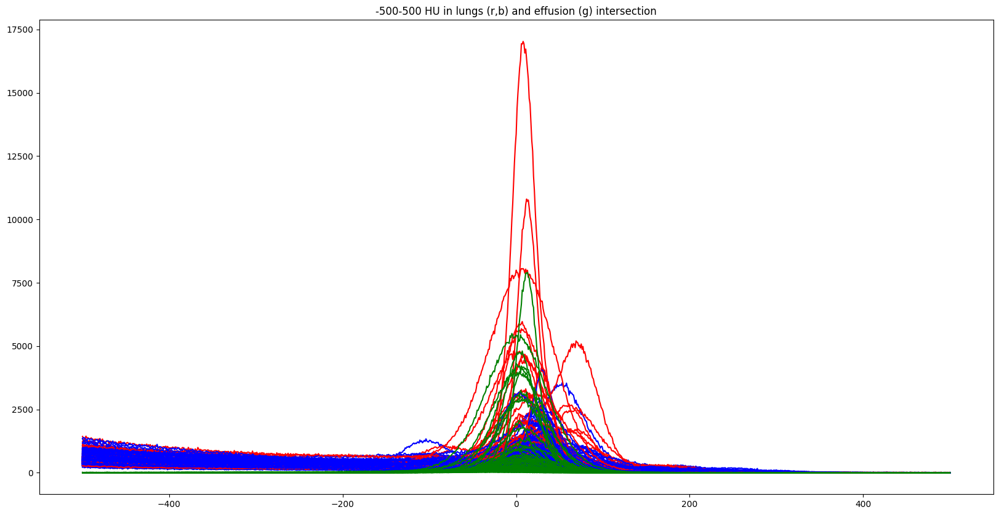

In [15]:
plot_data(data, "-500-500 HU in lungs (r,b) and effusion (g) intersection")

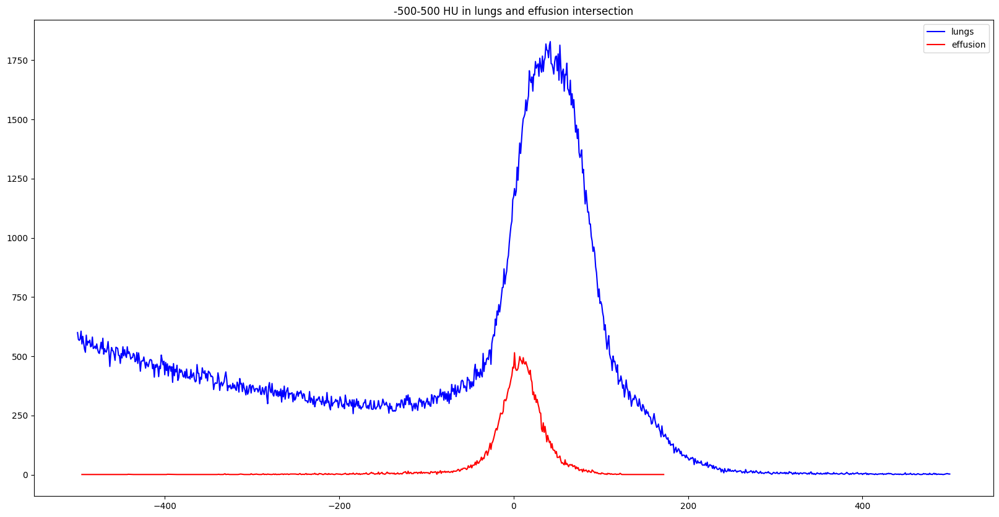

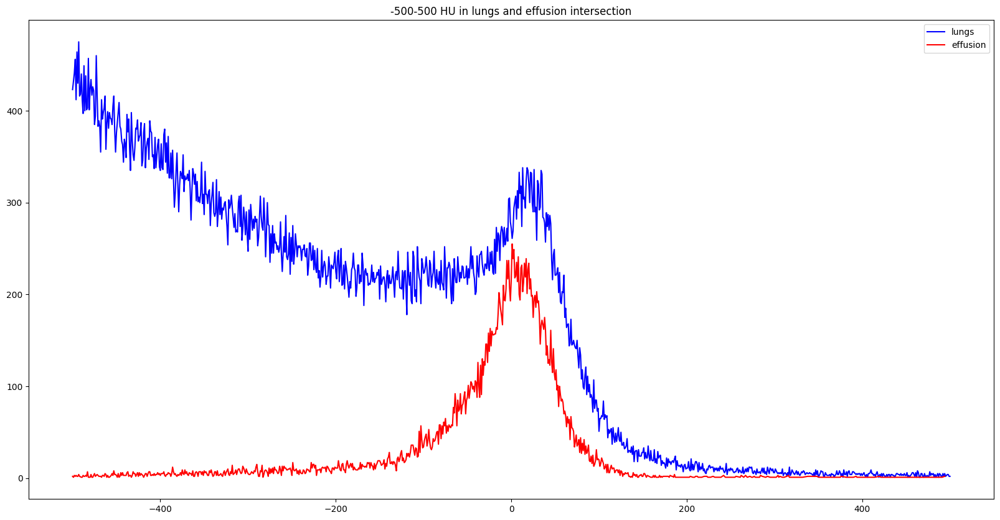

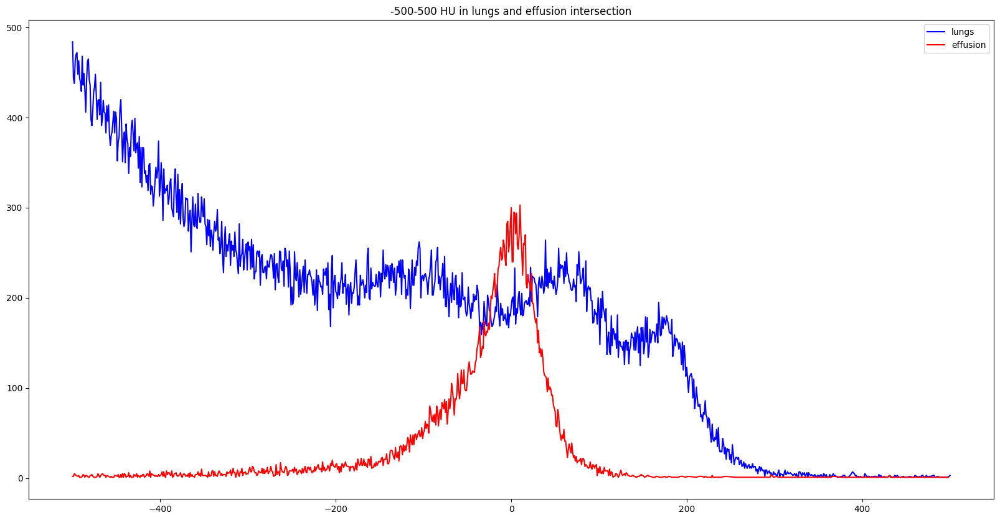

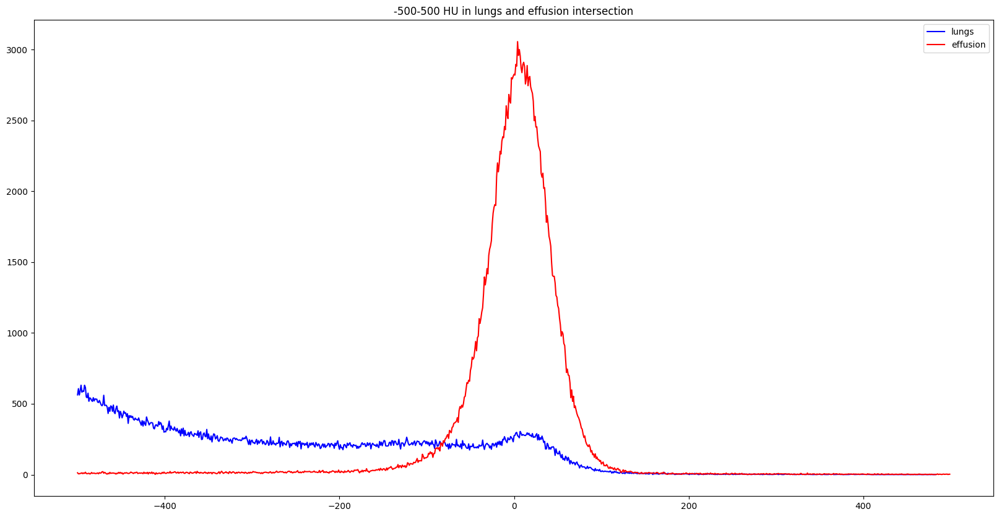

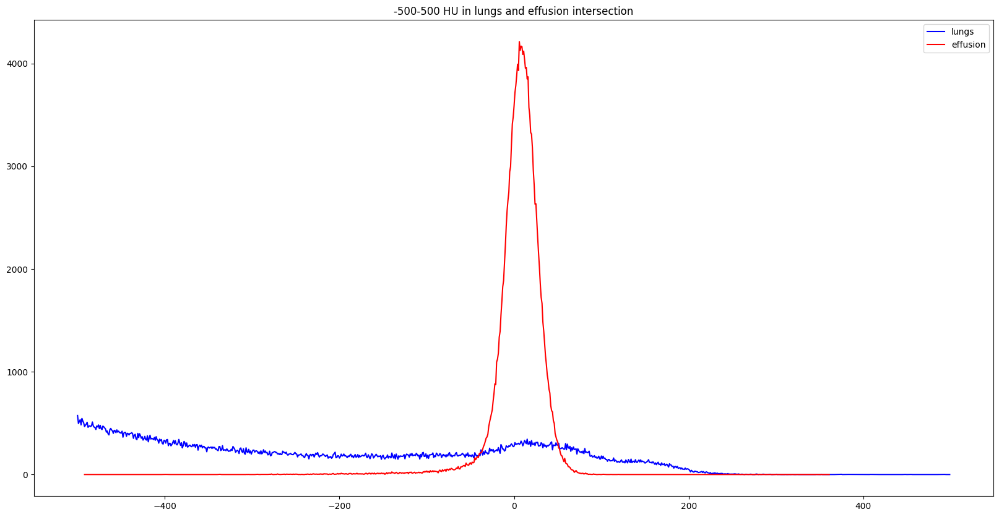

...

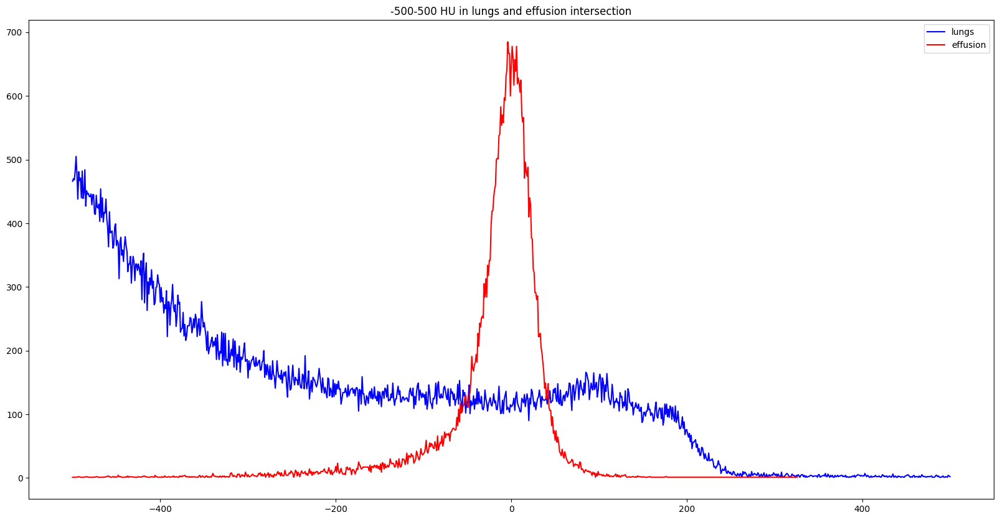

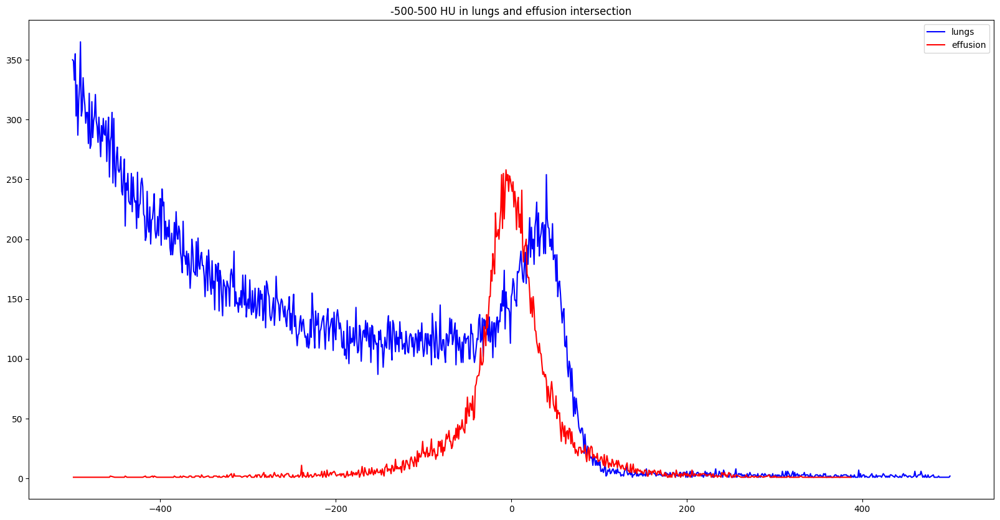

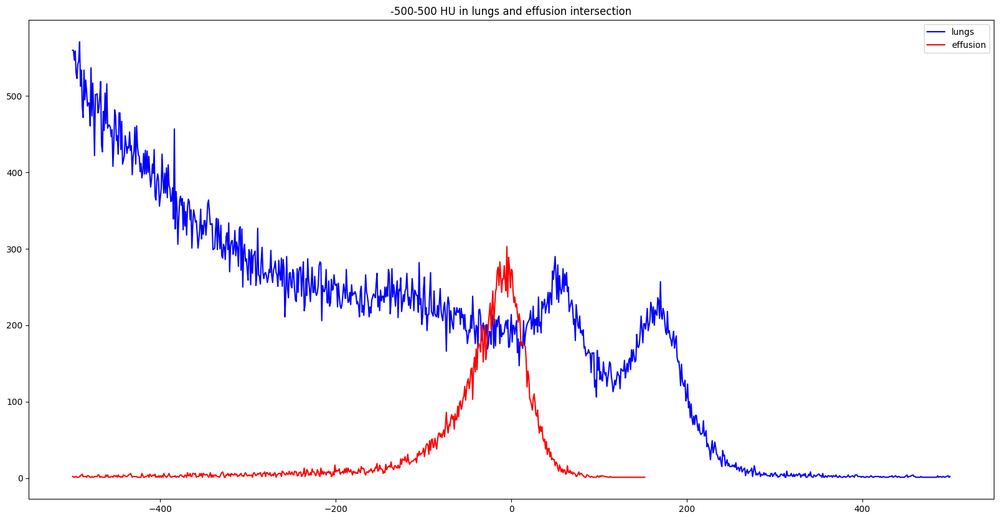

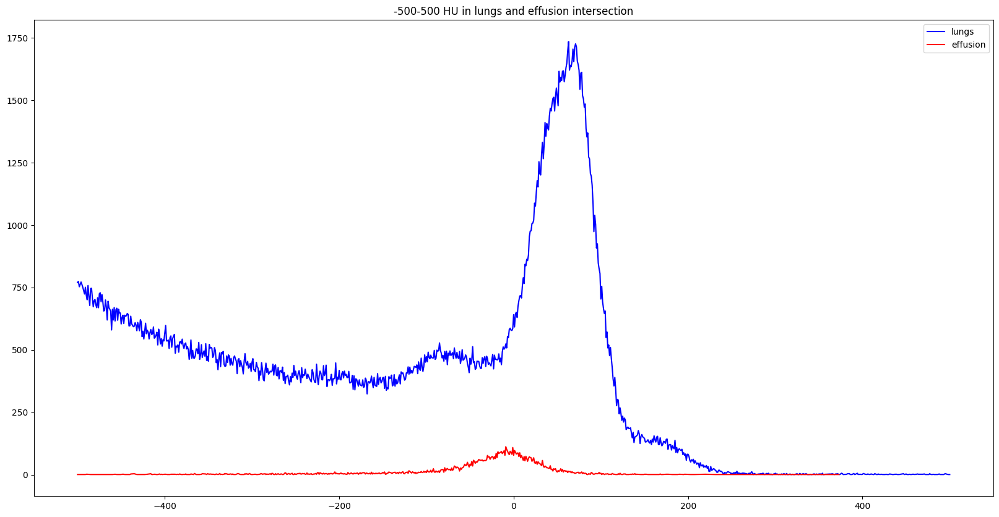

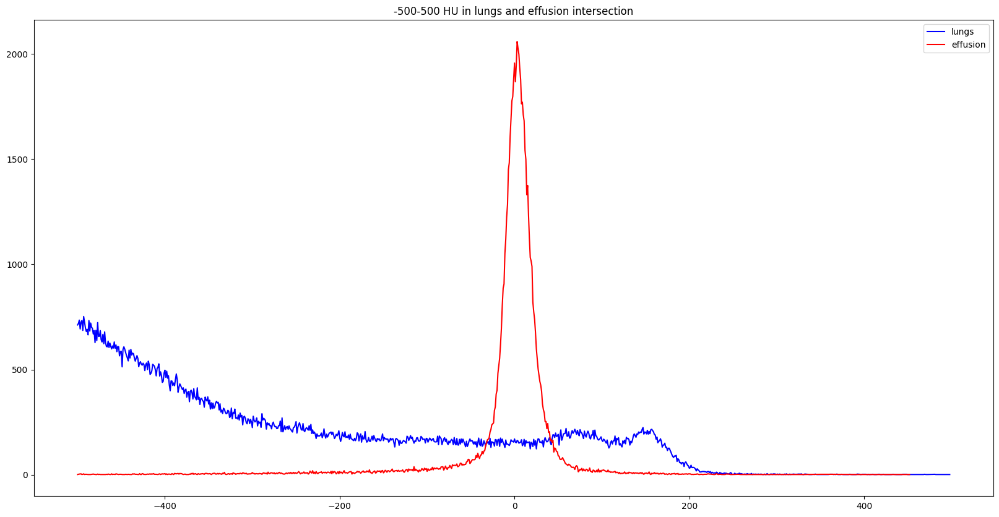

In [16]:
for x, y in zip(data[0], data[1]):
    fig, ax = plt.subplots(figsize=(20, 10))
    ax.plot(x[1], x[2], color="b", label="lungs")
    ax.plot(y[1], y[2], color="r", label="effusion")

    plt.legend()
    plt.title("-500-500 HU in lungs and effusion intersection")
    plt.show()


In [11]:
def plot_mid_slice_overlays(df):
    for id in df.index:
        if df.loc[id, "Effusion.Event"] == 1:
            overlay_images(id)

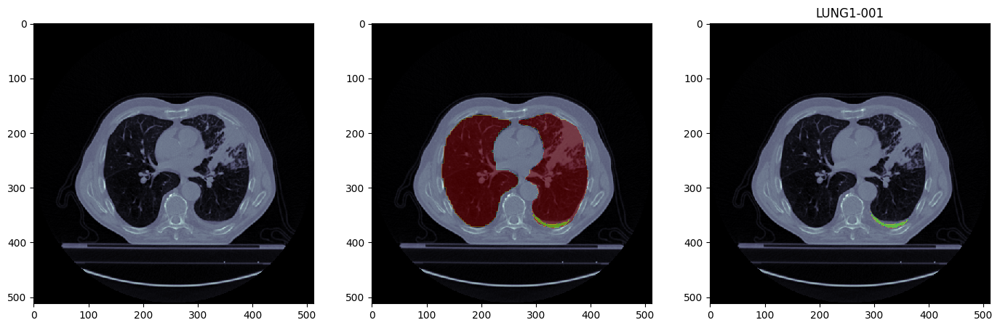

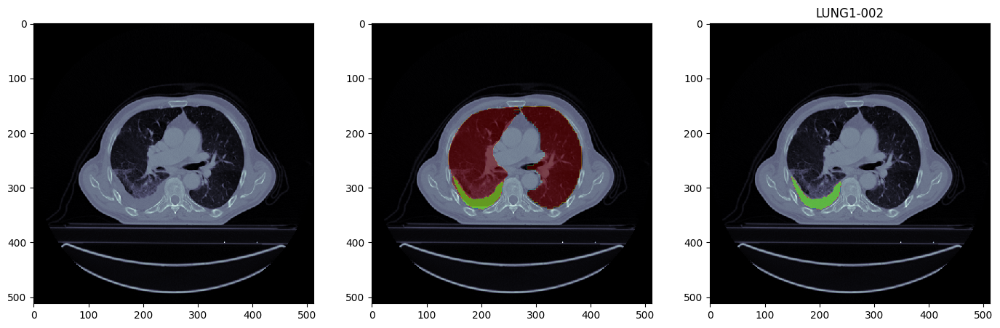

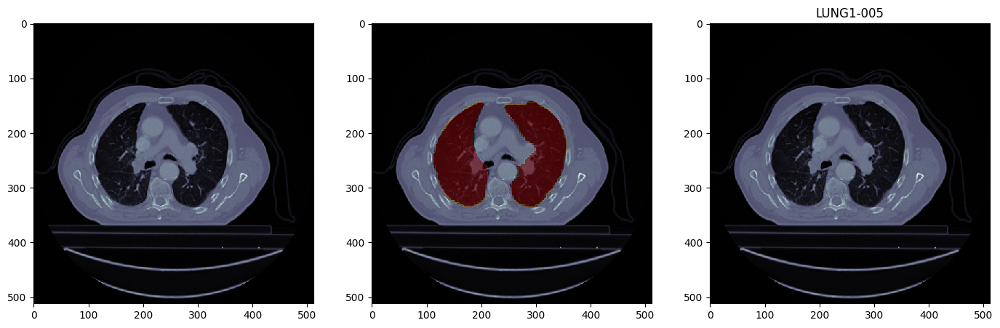

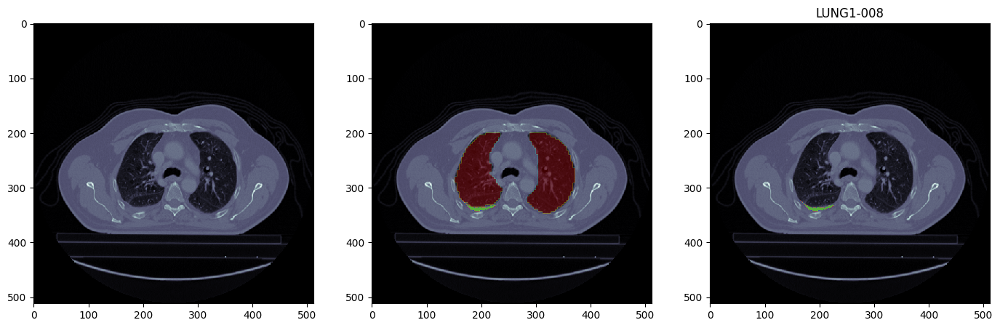

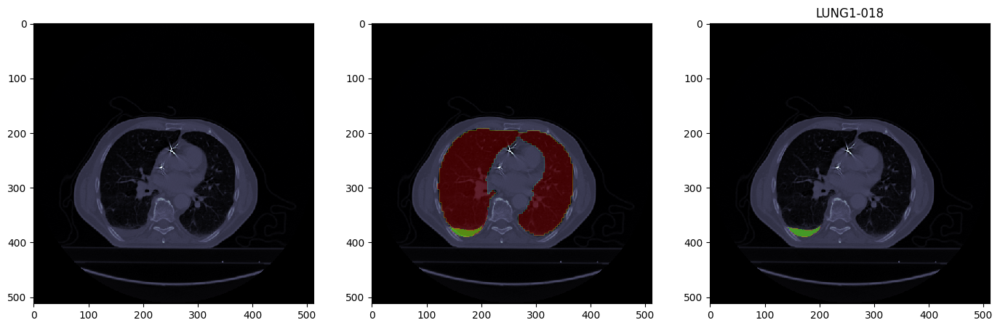

...

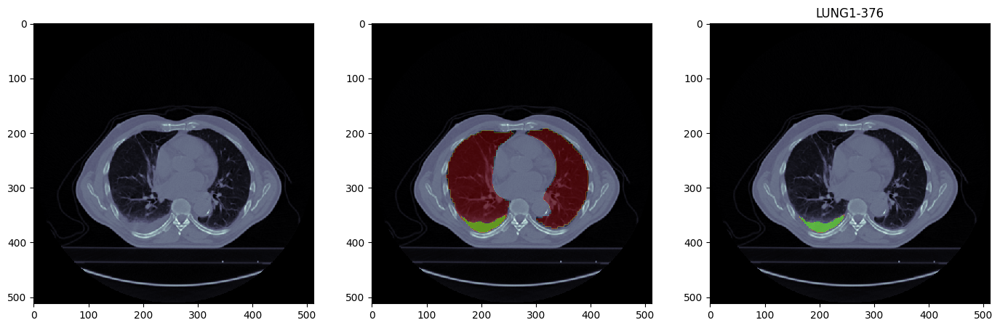

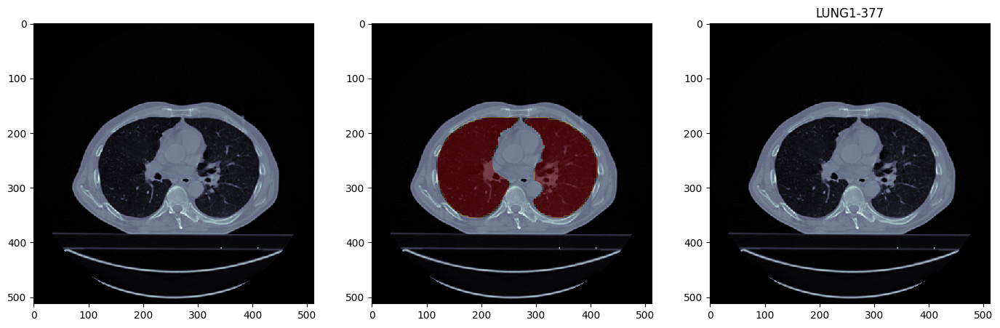

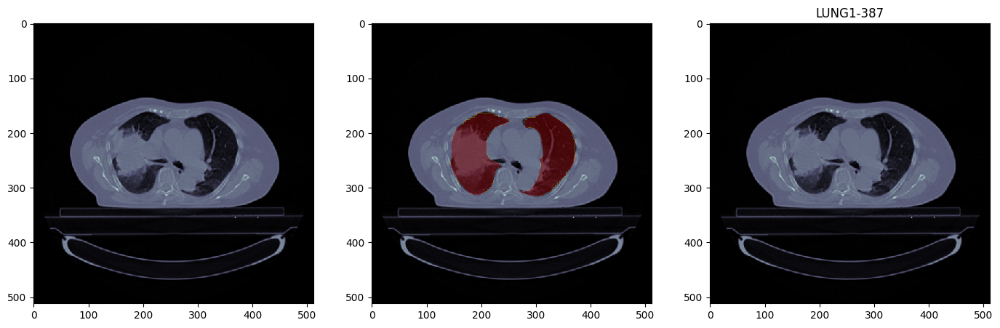

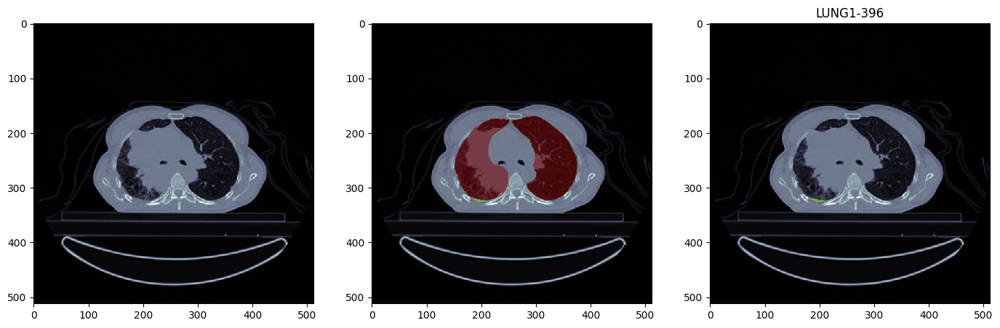

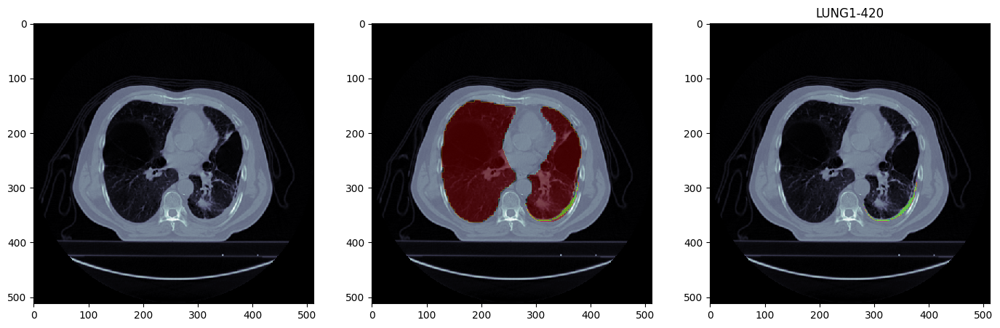

In [12]:
plot_mid_slice_overlays(df)